## Steps:

### 1) Delete the duplicated columns

### 2) Delete the outliers in columns that has less than 4% outliers, deleting all outliers results in deleting the dataset.

### 3) fill the NA with medium

### 4) split the data

### 5) check imbalance and resample the training data with SMOTE

### 6) Use Feature select to extract features

### 7) Load and clean the new features 

### 8) Fit the data with KNN, XGBoost classifier, and SVM classifier using cross validation.

### 9) Test performance using AUC , confusion matrix, and cross validation.

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.svm import SVC
from xgboost import XGBClassifier as XGC
from sklearn.metrics import auc, accuracy_score, confusion_matrix, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn import linear_model
from sklearn.feature_selection import RFECV
from sklearn import metrics
from sklearn.model_selection import KFold
from imblearn.over_sampling import SMOTE
from sklearn.metrics import RocCurveDisplay



In [3]:
Data = pd.read_csv("G:\dataset.csv")
display(Data)

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z,Label
0,117.5125,558.0,192.587460,1.271066,-0.034507,0.1783,-6713.7825,5.169266e+09,277.9850,1182.0,...,7.496750e+11,-742.663500,2841.75,598.380021,-0.946787,0.388256,0.2209,-46145.2712,1.168251e+11,downstairs
1,285.1325,1971.0,401.841201,2.244358,6.043515,0.1975,-19239.4775,2.589390e+10,420.2875,1761.0,...,9.030018e+11,-1038.084000,9676.80,1541.107858,1.504357,3.399815,0.0923,-169453.8976,3.620066e+11,downstairs
2,313.2925,1971.0,381.109542,2.439065,7.363269,0.2213,-19343.9062,2.729488e+10,566.8250,1761.0,...,1.339132e+12,-73.130250,9676.80,1926.697832,0.107699,-0.447804,0.0746,-163430.8428,2.971493e+11,downstairs
3,434.2375,1827.0,469.269182,1.121957,0.400659,0.2205,-26250.3631,4.774304e+10,729.2575,1849.0,...,7.376860e+11,338.552625,9254.40,1866.520614,-0.332954,0.596910,0.0591,-161704.5013,2.963615e+11,downstairs
4,544.0150,1827.0,509.326510,0.511355,-0.782151,0.2836,-28204.0649,6.805367e+10,870.6200,1948.0,...,8.535439e+11,-340.024500,9638.40,2836.116267,0.133436,-1.230015,0.0484,-271355.1914,6.604581e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,16.7275,132.0,41.550504,2.160707,2.705326,0.0846,-954.9611,1.825534e+08,19.8350,138.0,...,3.290809e+11,317.647875,4377.75,1163.692101,0.634335,-0.464264,0.1492,-58224.3614,1.242148e+11,spinning_bike
1196,11.9650,131.0,35.589751,2.741499,5.563885,0.0666,-751.4789,1.239845e+08,22.5400,138.0,...,3.434682e+11,272.236500,4300.95,1123.310678,0.609906,-0.415838,0.1752,-49310.4697,1.125520e+11,spinning_bike
1197,9.6675,128.0,31.223215,3.083986,7.631802,0.0601,-613.5523,9.275006e+07,23.3450,131.0,...,3.763346e+11,293.253750,4262.55,1180.292592,0.534295,-0.736452,0.1817,-52894.6522,1.249284e+11,spinning_bike
1198,11.6675,128.0,34.012705,2.707855,5.437852,0.0736,-698.6110,1.140998e+08,28.0450,134.0,...,3.678775e+11,378.217875,4492.95,1229.547258,0.393128,-0.998344,0.2093,-51164.6533,1.435290e+11,spinning_bike


### Plot functions

In [1043]:
def plot_X(df):
    for i in df.columns:
        sns.boxplot(df[[i]])
        plt.title(f"{i}")
        plt.show()
from matplotlib.colors import ListedColormap
def plot_L(df,Label):
    en = LabelEncoder()
    Label=en.fit_transform(Label)
    for i in range(len(df.columns)-1):
        fig,ax = plt.subplots()
        ax.scatter(df.iloc[:,i],df.iloc[:,i+1],c = Label)
        ax.set_xlabel(f"{df.columns[i]}")
        ax.set_ylabel(f"{df.columns[i+1]}")
        plt.show()

## concatenate function

In [5]:
def data_concate(df,Label):
    return pd.concat([df.iloc[:,:],Label], axis = 1)

## Remove outliers

In [196]:
def rm_box(Data):
    lis_del=[]
    for i in range(len(Data.columns)-1):
        IQR = (Data.iloc[:,i].quantile(0.75)) - (Data.iloc[:,i].quantile(0.25))
        Q4 = Data.iloc[:,i].quantile(0.75) + (1.5 *IQR )
        Q1 =  Data.iloc[:,i].quantile(0.25) - (1.5 * IQR)
        raws_1= Data.iloc[:,i]< Q4
        raws_2= Data.iloc[:,i]> Q1 
        total_raws = abs(sum(raws_1) - sum(raws_2))
        if total_raws <10:
#             print(total_raws)
            Data = Data[raws_1]
            Data = Data[raws_2]
            lis_del.append(total_raws)
#     print(sum(lis_del))
    return Data

## Detect the columns that has the same value at each row

In [34]:
def rmv_ls(Data):
    lis_del=[]
    for i in range(len(Data.columns)-1):
        IQR = (Data.iloc[:,i].quantile(0.75)) - (Data.iloc[:,i].quantile(0.25))
        Q4 = Data.iloc[:,i].quantile(0.75) + (1.5 *IQR )
        Q1 =  Data.iloc[:,i].quantile(0.25) - (1.5 * IQR)
        raws_1 = Data.iloc[:,i]<Q4
        raws_2 = Data.iloc[:,i]>Q1
        total_raws = sum(raws_1) - sum(raws_2)

        if  Q1==Q4:
            lis_del.append(Data.columns[i])
    print(lis_del)
    return lis_del

## Imbalance functions Smote

In [630]:
def refill(Data,Label):
    OverSample = SMOTE(sampling_strategy = "auto", random_state = 0)
    print(len(Label))
    Data, Label = OverSample.fit_resample(Data,Label)
    print(len(Label))
    return data_concate(Data , Label)
def refill_l(Data,Label):
    OverSample = SMOTE(sampling_strategy = "auto", random_state = 0)
    print(len(Label))
#         print(i)
    Data, Label = OverSample.fit_resample(Data,Label)
    print(len(Label))
    return Data , Label


## NA Identifier and filler.

In [36]:
def Na_id(df):
    for i,j in enumerate(df.isna().sum()):
        if j >0:
            print(df.iloc[:,i].name)
            print("Column number",i)
    return None

def Na_Num(df):
    return df.isna().sum()
            

In [37]:
def fill(df, label):
#     clist = df.columns()
    imputer = SimpleImputer(missing_values = np.NaN, strategy='median')
    df = imputer.fit_transform(df)
    df = pd.DataFrame(df)
    return data_concate(df, label)


In [38]:
Data.iloc[:,:-1]

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Entropy_R_mag_y,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z
0,117.5125,558.0,192.587460,1.271066,-0.034507,0.1783,-6713.7825,5.169266e+09,277.9850,1182.0,...,-110760.2109,7.496750e+11,-742.663500,2841.75,598.380021,-0.946787,0.388256,0.2209,-46145.2712,1.168251e+11
1,285.1325,1971.0,401.841201,2.244358,6.043515,0.1975,-19239.4775,2.589390e+10,420.2875,1761.0,...,-231199.5552,9.030018e+11,-1038.084000,9676.80,1541.107858,1.504357,3.399815,0.0923,-169453.8976,3.620066e+11
2,313.2925,1971.0,381.109542,2.439065,7.363269,0.2213,-19343.9062,2.729488e+10,566.8250,1761.0,...,-263535.3564,1.339132e+12,-73.130250,9676.80,1926.697832,0.107699,-0.447804,0.0746,-163430.8428,2.971493e+11
3,434.2375,1827.0,469.269182,1.121957,0.400659,0.2205,-26250.3631,4.774304e+10,729.2575,1849.0,...,-240585.3380,7.376860e+11,338.552625,9254.40,1866.520614,-0.332954,0.596910,0.0591,-161704.5013,2.963615e+11
4,544.0150,1827.0,509.326510,0.511355,-0.782151,0.2836,-28204.0649,6.805367e+10,870.6200,1948.0,...,-312990.6706,8.535439e+11,-340.024500,9638.40,2836.116267,0.133436,-1.230015,0.0484,-271355.1914,6.604581e+11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,16.7275,132.0,41.550504,2.160707,2.705326,0.0846,-954.9611,1.825534e+08,19.8350,138.0,...,-61958.0972,3.290809e+11,317.647875,4377.75,1163.692101,0.634335,-0.464264,0.1492,-58224.3614,1.242148e+11
1196,11.9650,131.0,35.589751,2.741499,5.563885,0.0666,-751.4789,1.239845e+08,22.5400,138.0,...,-64700.8794,3.434682e+11,272.236500,4300.95,1123.310678,0.609906,-0.415838,0.1752,-49310.4697,1.125520e+11
1197,9.6675,128.0,31.223215,3.083986,7.631802,0.0601,-613.5523,9.275006e+07,23.3450,131.0,...,-72344.9929,3.763346e+11,293.253750,4262.55,1180.292592,0.534295,-0.736452,0.1817,-52894.6522,1.249284e+11
1198,11.6675,128.0,34.012705,2.707855,5.437852,0.0736,-698.6110,1.140998e+08,28.0450,134.0,...,-77925.0697,3.678775e+11,378.217875,4492.95,1229.547258,0.393128,-0.998344,0.2093,-51164.6533,1.435290e+11


In [2009]:
#Columns of Na and columns numbers
Na_id(Data)


DFR_L_hallux
Column number 5
DFR_L_toes
Column number 13
DFR_L_met_3
Column number 29
DFR_L_heel_l
Column number 53
DFR_L_heel_r
Column number 61
DFR_R_toes
Column number 149
DFR_R_heel_r
Column number 197


In [143]:
df = data_concate(Data.iloc[:,:-1], Data.iloc[:,-1])
df

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z,Label
0,117.5125,558.0,192.587460,1.271066,-0.034507,0.1783,-6713.7825,5.169266e+09,277.9850,1182.0,...,7.496750e+11,-742.663500,2841.75,598.380021,-0.946787,0.388256,0.2209,-46145.2712,1.168251e+11,downstairs
1,285.1325,1971.0,401.841201,2.244358,6.043515,0.1975,-19239.4775,2.589390e+10,420.2875,1761.0,...,9.030018e+11,-1038.084000,9676.80,1541.107858,1.504357,3.399815,0.0923,-169453.8976,3.620066e+11,downstairs
2,313.2925,1971.0,381.109542,2.439065,7.363269,0.2213,-19343.9062,2.729488e+10,566.8250,1761.0,...,1.339132e+12,-73.130250,9676.80,1926.697832,0.107699,-0.447804,0.0746,-163430.8428,2.971493e+11,downstairs
3,434.2375,1827.0,469.269182,1.121957,0.400659,0.2205,-26250.3631,4.774304e+10,729.2575,1849.0,...,7.376860e+11,338.552625,9254.40,1866.520614,-0.332954,0.596910,0.0591,-161704.5013,2.963615e+11,downstairs
4,544.0150,1827.0,509.326510,0.511355,-0.782151,0.2836,-28204.0649,6.805367e+10,870.6200,1948.0,...,8.535439e+11,-340.024500,9638.40,2836.116267,0.133436,-1.230015,0.0484,-271355.1914,6.604581e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,16.7275,132.0,41.550504,2.160707,2.705326,0.0846,-954.9611,1.825534e+08,19.8350,138.0,...,3.290809e+11,317.647875,4377.75,1163.692101,0.634335,-0.464264,0.1492,-58224.3614,1.242148e+11,spinning_bike
1196,11.9650,131.0,35.589751,2.741499,5.563885,0.0666,-751.4789,1.239845e+08,22.5400,138.0,...,3.434682e+11,272.236500,4300.95,1123.310678,0.609906,-0.415838,0.1752,-49310.4697,1.125520e+11,spinning_bike
1197,9.6675,128.0,31.223215,3.083986,7.631802,0.0601,-613.5523,9.275006e+07,23.3450,131.0,...,3.763346e+11,293.253750,4262.55,1180.292592,0.534295,-0.736452,0.1817,-52894.6522,1.249284e+11,spinning_bike
1198,11.6675,128.0,34.012705,2.707855,5.437852,0.0736,-698.6110,1.140998e+08,28.0450,134.0,...,3.678775e+11,378.217875,4492.95,1229.547258,0.393128,-0.998344,0.2093,-51164.6533,1.435290e+11,spinning_bike


### Removing All duplicated features

In [144]:
# getting duplicated rows
d =rmv_ls(df)
df.loc[:,['Mean_L_mag_x', 'Range_L_mag_x', 'St_Dev_L_mag_x', 'Skewness_L_mag_x', 'Kurtosis_L_mag_x',
          'DFR_L_mag_x', 'Entropy_L_mag_x', 'Energy_L_mag_x', 'Mean_R_mag_x', 'Range_R_mag_x', 'St_Dev_R_mag_x', 
          'Skewness_R_mag_x','Kurtosis_R_mag_x', 'DFR_R_mag_x', 'Entropy_R_mag_x', 'Energy_R_mag_x']]

['Mean_L_mag_x', 'Range_L_mag_x', 'St_Dev_L_mag_x', 'Skewness_L_mag_x', 'Kurtosis_L_mag_x', 'DFR_L_mag_x', 'Entropy_L_mag_x', 'Energy_L_mag_x', 'Mean_R_mag_x', 'Range_R_mag_x', 'St_Dev_R_mag_x', 'Skewness_R_mag_x', 'Kurtosis_R_mag_x', 'DFR_R_mag_x', 'Entropy_R_mag_x', 'Energy_R_mag_x']


,Mean_L_mag_x,Range_L_mag_x,St_Dev_L_mag_x,Skewness_L_mag_x,Kurtosis_L_mag_x,DFR_L_mag_x,Entropy_L_mag_x,Energy_L_mag_x,Mean_R_mag_x,Range_R_mag_x,St_Dev_R_mag_x,Skewness_R_mag_x,Kurtosis_R_mag_x,DFR_R_mag_x,Entropy_R_mag_x,Energy_R_mag_x
0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
1,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
2,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
3,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
4,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
1196,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
1197,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0
1198,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0,0.15,0.0,0.0,0.0,-3.0,1.0,0.5206,3600.0


In [145]:
# Droping all columns that is duplicating
df = df.drop(d, axis = 1)

In [146]:
df

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z,Label
0,117.5125,558.0,192.587460,1.271066,-0.034507,0.1783,-6713.7825,5.169266e+09,277.9850,1182.0,...,7.496750e+11,-742.663500,2841.75,598.380021,-0.946787,0.388256,0.2209,-46145.2712,1.168251e+11,downstairs
1,285.1325,1971.0,401.841201,2.244358,6.043515,0.1975,-19239.4775,2.589390e+10,420.2875,1761.0,...,9.030018e+11,-1038.084000,9676.80,1541.107858,1.504357,3.399815,0.0923,-169453.8976,3.620066e+11,downstairs
2,313.2925,1971.0,381.109542,2.439065,7.363269,0.2213,-19343.9062,2.729488e+10,566.8250,1761.0,...,1.339132e+12,-73.130250,9676.80,1926.697832,0.107699,-0.447804,0.0746,-163430.8428,2.971493e+11,downstairs
3,434.2375,1827.0,469.269182,1.121957,0.400659,0.2205,-26250.3631,4.774304e+10,729.2575,1849.0,...,7.376860e+11,338.552625,9254.40,1866.520614,-0.332954,0.596910,0.0591,-161704.5013,2.963615e+11,downstairs
4,544.0150,1827.0,509.326510,0.511355,-0.782151,0.2836,-28204.0649,6.805367e+10,870.6200,1948.0,...,8.535439e+11,-340.024500,9638.40,2836.116267,0.133436,-1.230015,0.0484,-271355.1914,6.604581e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,16.7275,132.0,41.550504,2.160707,2.705326,0.0846,-954.9611,1.825534e+08,19.8350,138.0,...,3.290809e+11,317.647875,4377.75,1163.692101,0.634335,-0.464264,0.1492,-58224.3614,1.242148e+11,spinning_bike
1196,11.9650,131.0,35.589751,2.741499,5.563885,0.0666,-751.4789,1.239845e+08,22.5400,138.0,...,3.434682e+11,272.236500,4300.95,1123.310678,0.609906,-0.415838,0.1752,-49310.4697,1.125520e+11,spinning_bike
1197,9.6675,128.0,31.223215,3.083986,7.631802,0.0601,-613.5523,9.275006e+07,23.3450,131.0,...,3.763346e+11,293.253750,4262.55,1180.292592,0.534295,-0.736452,0.1817,-52894.6522,1.249284e+11,spinning_bike
1198,11.6675,128.0,34.012705,2.707855,5.437852,0.0736,-698.6110,1.140998e+08,28.0450,134.0,...,3.678775e+11,378.217875,4492.95,1229.547258,0.393128,-0.998344,0.2093,-51164.6533,1.435290e+11,spinning_bike


### Display all Boxplots and scatter plot

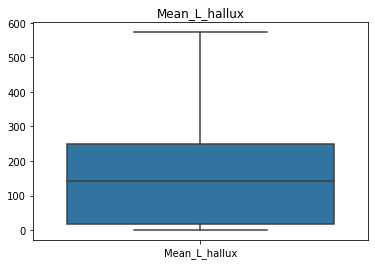

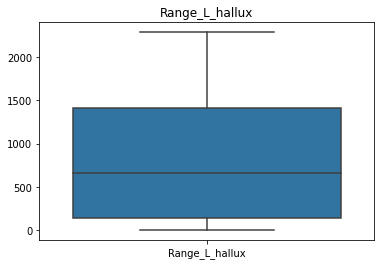

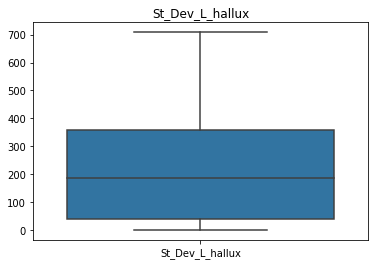

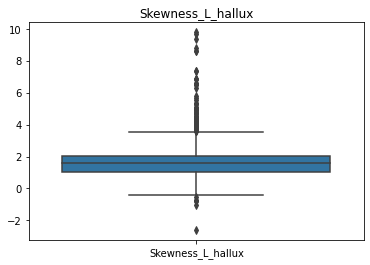

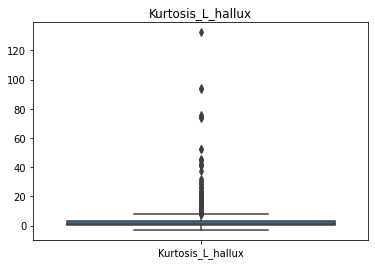

...

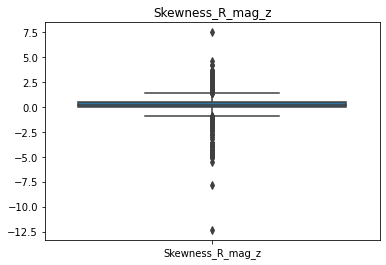

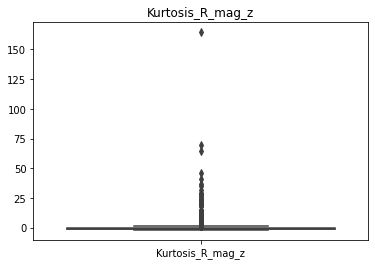

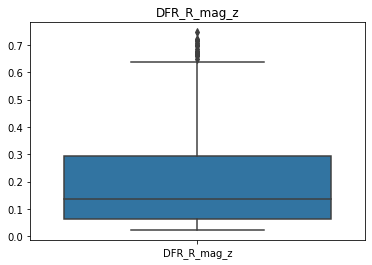

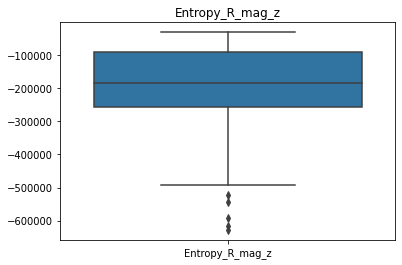

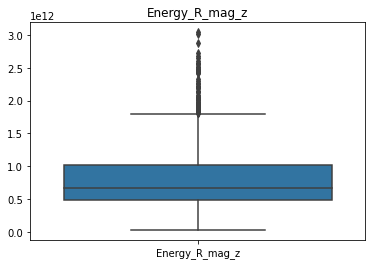

In [920]:
plot_X(df.iloc[:,:-1])

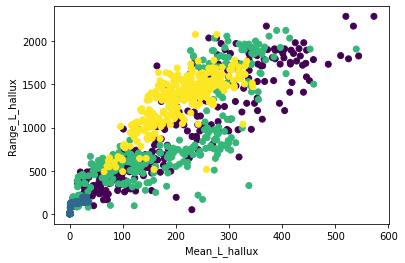

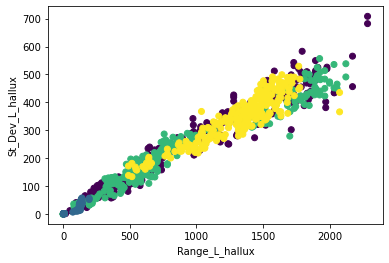

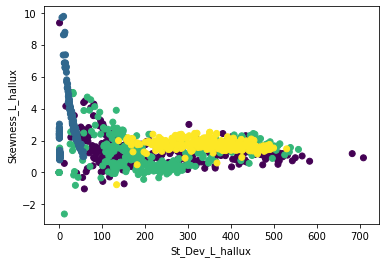

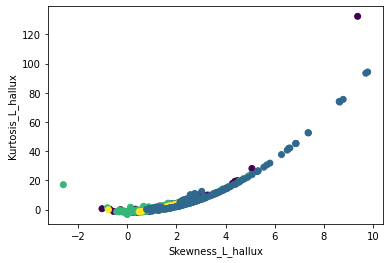

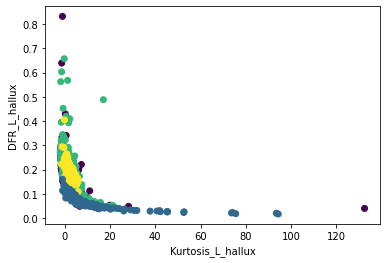

...

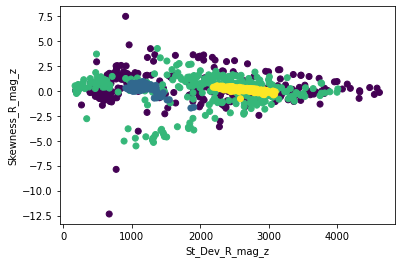

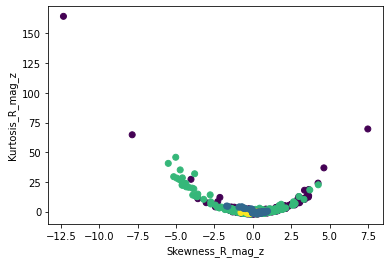

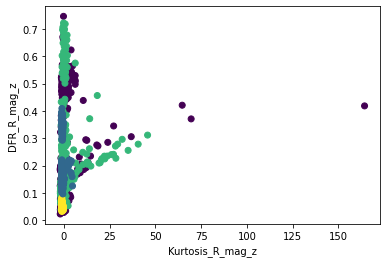

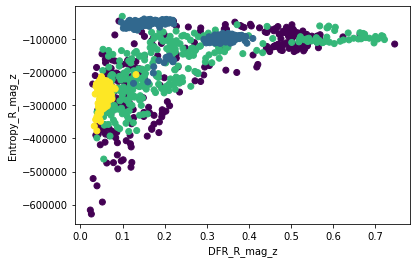

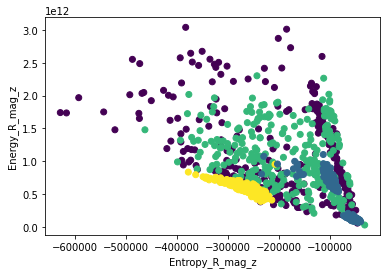

In [1008]:
plot_L(df.iloc[:,:-1],df.iloc[:,-1])

## Remove some of the outliers since a lot of outliers represents the class downstairs, upstairs are highly affected by outliers removing

In [197]:
df_rm = rm_box(df)
df_rm

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z,Label
48,246.1775,1133.0,282.106871,0.817819,-0.286102,0.1979,-14096.4293,1.604754e+10,562.6425,1716.0,...,6.572287e+11,-1829.746500,7910.55,1816.356379,0.865245,0.087611,0.2492,-127744.7832,7.989479e+11,downstairs
110,265.6225,1569.0,358.672881,1.626176,2.377702,0.1973,-17435.6757,2.155482e+10,519.9275,1646.0,...,3.254059e+11,-1195.841625,7910.55,2161.198259,0.456804,-0.805230,0.1728,-120096.7327,6.015430e+11,downstairs
168,46.5050,328.0,76.921664,1.542829,1.526187,0.1316,-2570.4052,8.182067e+08,164.2150,640.0,...,1.169307e+12,1462.740000,2649.60,474.238139,0.128211,-0.031555,0.3797,-59720.6580,3.602958e+11,downstairs
184,65.8150,594.0,143.117512,2.386431,4.823316,0.1267,-4839.3877,2.327582e+09,188.7525,1189.0,...,1.008124e+12,1885.044000,2150.40,572.951363,0.259542,-1.079456,0.4609,-69866.5644,5.947395e+11,downstairs
185,21.4825,190.0,52.323360,2.182489,3.103093,0.0950,-1318.3980,2.923114e+08,129.6275,609.0,...,1.020602e+12,2208.180000,2419.20,604.668610,-0.059998,-1.069286,0.4864,-79731.6383,8.093490e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1191,16.2175,141.0,41.616764,2.287107,3.290287,0.1084,-814.7080,1.802912e+08,30.7275,140.0,...,2.852444e+11,177.084750,3955.35,1076.922312,0.344309,-0.992938,0.2042,-41072.9703,9.756643e+10,spinning_bike
1192,9.0625,128.0,30.787144,3.339419,9.241292,0.0686,-545.0205,8.877918e+07,27.5750,134.0,...,3.208558e+11,234.789375,3686.55,1002.929472,0.091775,-0.914142,0.1777,-43352.6163,8.908859e+10,spinning_bike
1193,16.3900,128.0,40.505118,2.176004,2.790020,0.0927,-876.7410,1.739104e+08,25.7175,134.0,...,4.190897e+11,514.461750,4300.95,1085.343306,0.060014,-0.747802,0.1463,-53198.9722,1.363494e+11,spinning_bike
1194,17.8575,132.0,42.485524,2.045059,2.222541,0.0935,-954.2566,1.950639e+08,19.6525,133.0,...,4.121370e+11,534.621000,4531.35,1214.021640,0.318478,-0.878947,0.1276,-71604.2416,1.633474e+11,spinning_bike


In [199]:
df_rm.iloc[:,-1].value_counts()

walking          282
spinning_bike    196
downstairs        20
upstairs          17
Name: Label, dtype: int64

In [148]:
Na_id(df_rm)

DFR_L_heel_l
Column number 53
DFR_L_heel_r
Column number 61


### Reset Index

In [149]:
df_rm = df_rm.reset_index(drop = True)

In [150]:
df_rm

,Mean_L_hallux,Range_L_hallux,St_Dev_L_hallux,Skewness_L_hallux,Kurtosis_L_hallux,DFR_L_hallux,Entropy_L_hallux,Energy_L_hallux,Mean_L_toes,Range_L_toes,...,Energy_R_mag_y,Mean_R_mag_z,Range_R_mag_z,St_Dev_R_mag_z,Skewness_R_mag_z,Kurtosis_R_mag_z,DFR_R_mag_z,Entropy_R_mag_z,Energy_R_mag_z,Label
0,28.8175,328.0,68.709291,2.469848,5.441202,0.1090,-1818.3912,5.096085e+08,124.5600,640.0,...,1.111646e+12,-381.708000,9676.80,2744.010848,-0.556624,-1.267357,0.1318,-168260.9059,6.241869e+11,downstairs
1,46.5050,328.0,76.921664,1.542829,1.526187,0.1316,-2570.4052,8.182067e+08,164.2150,640.0,...,1.169307e+12,1462.740000,2649.60,474.238139,0.128211,-0.031555,0.3797,-59720.6580,3.602958e+11,downstairs
2,16.9100,213.0,50.748699,2.847889,6.611479,0.0489,-1702.4916,2.513323e+08,111.3950,716.0,...,1.084154e+12,1571.892000,2419.20,618.511588,-0.000392,-1.151881,0.3467,-70872.5406,4.258637e+11,downstairs
3,42.0200,577.0,101.872812,3.045464,10.290854,0.0663,-4450.2894,1.110866e+09,119.4675,823.0,...,1.212018e+12,2126.292000,2496.00,551.030485,0.236311,-0.658238,0.4423,-80645.9150,7.476106e+11,downstairs
4,68.4125,577.0,115.147513,2.201477,5.291522,0.0974,-5389.8906,1.806908e+09,139.9200,823.0,...,1.168186e+12,2352.852000,1996.80,538.961593,-0.202754,-1.164367,0.4734,-85724.3851,9.089264e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
510,36.3100,141.0,57.454516,0.991558,-0.988961,0.1609,-1478.3333,4.743685e+08,25.1750,140.0,...,3.193415e+11,207.617250,3993.75,1099.262778,0.340621,-1.043482,0.2127,-42093.2237,1.033255e+11,spinning_bike
511,16.2175,141.0,41.616764,2.287107,3.290287,0.1084,-814.7080,1.802912e+08,30.7275,140.0,...,2.852444e+11,177.084750,3955.35,1076.922312,0.344309,-0.992938,0.2042,-41072.9703,9.756643e+10,spinning_bike
512,16.3900,128.0,40.505118,2.176004,2.790020,0.0927,-876.7410,1.739104e+08,25.7175,134.0,...,4.190897e+11,514.461750,4300.95,1085.343306,0.060014,-0.747802,0.1463,-53198.9722,1.363494e+11,spinning_bike
513,17.8575,132.0,42.485524,2.045059,2.222541,0.0935,-954.2566,1.950639e+08,19.6525,133.0,...,4.121370e+11,534.621000,4531.35,1214.021640,0.318478,-0.878947,0.1276,-71604.2416,1.633474e+11,spinning_bike


In [200]:
df_rm.iloc[:,-1].value_counts()

walking          282
spinning_bike    196
downstairs        20
upstairs          17
Name: Label, dtype: int64

#### Filling Nan with median

In [658]:
#filling Nan with median
df_fill = fill(df_rm.iloc[:,:-1], df_rm.iloc[:,-1])
df_fill


,0,1,2,3,4,5,6,7,8,9,...,247,248,249,250,251,252,253,254,255,Label
0,28.8175,328.0,68.709291,2.469848,5.441202,0.1090,-1818.3912,5.096085e+08,124.5600,640.0,...,1.111646e+12,-381.708000,9676.80,2744.010848,-0.556624,-1.267357,0.1318,-168260.9059,6.241869e+11,downstairs
1,46.5050,328.0,76.921664,1.542829,1.526187,0.1316,-2570.4052,8.182067e+08,164.2150,640.0,...,1.169307e+12,1462.740000,2649.60,474.238139,0.128211,-0.031555,0.3797,-59720.6580,3.602958e+11,downstairs
2,16.9100,213.0,50.748699,2.847889,6.611479,0.0489,-1702.4916,2.513323e+08,111.3950,716.0,...,1.084154e+12,1571.892000,2419.20,618.511588,-0.000392,-1.151881,0.3467,-70872.5406,4.258637e+11,downstairs
3,42.0200,577.0,101.872812,3.045464,10.290854,0.0663,-4450.2894,1.110866e+09,119.4675,823.0,...,1.212018e+12,2126.292000,2496.00,551.030485,0.236311,-0.658238,0.4423,-80645.9150,7.476106e+11,downstairs
4,68.4125,577.0,115.147513,2.201477,5.291522,0.0974,-5389.8906,1.806908e+09,139.9200,823.0,...,1.168186e+12,2352.852000,1996.80,538.961593,-0.202754,-1.164367,0.4734,-85724.3851,9.089264e+11,downstairs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
510,36.3100,141.0,57.454516,0.991558,-0.988961,0.1609,-1478.3333,4.743685e+08,25.1750,140.0,...,3.193415e+11,207.617250,3993.75,1099.262778,0.340621,-1.043482,0.2127,-42093.2237,1.033255e+11,spinning_bike
511,16.2175,141.0,41.616764,2.287107,3.290287,0.1084,-814.7080,1.802912e+08,30.7275,140.0,...,2.852444e+11,177.084750,3955.35,1076.922312,0.344309,-0.992938,0.2042,-41072.9703,9.756643e+10,spinning_bike
512,16.3900,128.0,40.505118,2.176004,2.790020,0.0927,-876.7410,1.739104e+08,25.7175,134.0,...,4.190897e+11,514.461750,4300.95,1085.343306,0.060014,-0.747802,0.1463,-53198.9722,1.363494e+11,spinning_bike
513,17.8575,132.0,42.485524,2.045059,2.222541,0.0935,-954.2566,1.950639e+08,19.6525,133.0,...,4.121370e+11,534.621000,4531.35,1214.021640,0.318478,-0.878947,0.1276,-71604.2416,1.633474e+11,spinning_bike


In [659]:
# df_refil = refill(df_fill.iloc[:,:-1], df_fill.iloc[:,-1])
df_refil = df_fill

In [206]:
# test = rm_box(df_refil)
# test = refill(test.iloc[:,:-1], test.iloc[:,-1])

909
1080


In [662]:
train_x, test_x, train_y, test_y = train_test_split(df_refil.iloc[:,:-1], df_refil.iloc[:,-1], stratify = df_refil.iloc[:,-1])


In [663]:
train_y.value_counts()

walking          211
spinning_bike    147
downstairs        15
upstairs          13
Name: Label, dtype: int64

In [664]:
test_y.value_counts()

walking          71
spinning_bike    49
downstairs        5
upstairs          4
Name: Label, dtype: int64

In [665]:
train_y.value_counts()

walking          211
spinning_bike    147
downstairs        15
upstairs          13
Name: Label, dtype: int64

In [667]:
train_x, train_y = refill_l(train_x,train_y)


386
844


In [668]:
normalizer = MinMaxScaler()
encoder = LabelEncoder()
train_x = normalizer.fit_transform(train_x)
train_y = encoder.fit_transform(train_y)

In [669]:
encoder.classes_

array(['downstairs', 'spinning_bike', 'upstairs', 'walking'], dtype=object)

In [670]:

test_y = encoder.transform(test_y)
test_x = normalizer.transform(test_x) 


## Feature Selection

In [672]:
estimator = linear_model.LogisticRegression(multi_class='auto')
rfecv = RFECV((estimator), cv=10)
rfecv.fit(train_x, train_y)

RFECV(cv=10, estimator=LogisticRegression())

In [673]:
print ("\n",rfecv.n_features_)
print ("\n",rfecv.ranking_)
print ("\n",rfecv.support_)


 7

 [110  88 135 245 249 199 117 169 132 129 160 239 248 156 145 155  91 197
  77 205 216 139  45 181 203 142 161 243 242 221 184 210 166 134 190 230
 246 231 170 214 204 137 172 200 217 229 186 209  93 115  31 201 215 235
  42  86  22  61  10 102  83  69   3  66  24 118 192   2  51  99  56  34
  81  15 124  73 121 228 103  95 157 174  78 218 183 234  21  90 179  65
  25  36 163 150  37   1   7  57   5 171 112 119  17  28 226 153  52   6
  63 113 111  18 136   1 211 191  30 159 122 224  16   1  49 108 158  29
  74 133  27  44 104 208 212 225  75  64  89   9  96 193 168 236  19  58
   4 130  94 105 187  35  68 147 125  80 138 240 244  48 114 206  76  46
  70 247 250 194  40 120 106  13  50 233 241 238  62 126 123 195 176 202
 207  98 185 182 100  84 164 237 227  72 152 198  79 177 232  82  33 151
  26  60 180  54 173  12   1 223 149 189   1  92 107 116 131 154  39  47
 148 175  67  85 141 165 140 101  32 109  53 162 196 128  71 146 188 167
  14   1  11  41 127   1 143 144  20 178  59 

### Picking features that weights most

In [2022]:
ls =[]
for i,j in enumerate(rfecv.support_):
    if j==True:
        ls.append(df.columns[i])

In [2023]:
ls

['Energy_L_gyr_x',
 'Range_L_mag_y',
 'Range_L_mag_z',
 'Kurtosis_R_acc_y',
 'Mean_R_acc_z',
 'Skewness_R_gyr_z',
 'Energy_R_gyr_z']

In [2120]:
new_df = df.loc[:,ls]
new_df = data_concate(new_df,df.iloc[:,-1])

In [2121]:
new_df

,Energy_L_gyr_x,Range_L_mag_y,Range_L_mag_z,Kurtosis_R_acc_y,Mean_R_acc_z,Skewness_R_gyr_z,Energy_R_gyr_z,Label
0,6.261104e+10,9789.75,8486.40,3.920794,-0.335291,-0.686718,2.168748e+11,downstairs
1,2.474021e+11,9789.60,9292.80,2.849683,-0.662534,-0.923555,5.214321e+11,downstairs
2,3.282250e+11,9789.60,9636.15,4.582937,-0.220761,-0.883332,7.017985e+11,downstairs
3,2.802015e+11,9789.60,9021.75,4.600858,-0.005902,-0.830130,8.511117e+11,downstairs
4,3.344556e+11,9638.40,8294.55,4.097150,-2.427795,-0.474324,1.301358e+12,downstairs
...,...,...,...,...,...,...,...,...
1195,1.589234e+10,5414.55,9789.75,-1.358834,0.449354,-0.000162,2.228544e+11,spinning_bike
1196,1.479640e+10,5414.55,9789.75,-1.518912,0.407991,-0.143977,2.171153e+11,spinning_bike
1197,1.310924e+10,4876.95,9789.75,-1.500510,0.352031,-0.199551,2.011129e+11,spinning_bike
1198,1.141166e+10,4876.95,9789.75,-1.410115,0.361049,-0.231414,1.979332e+11,spinning_bike


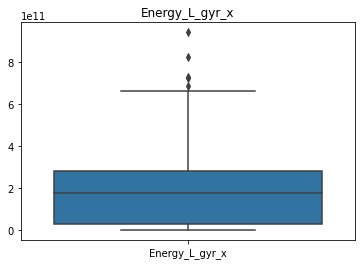

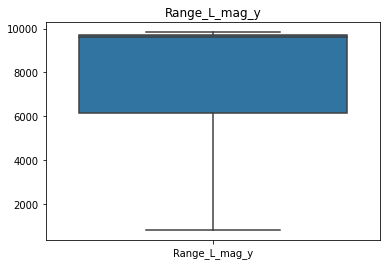

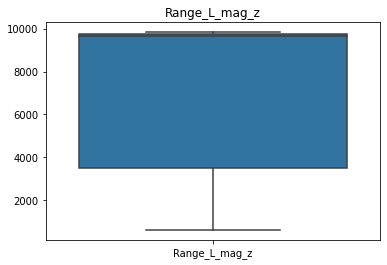

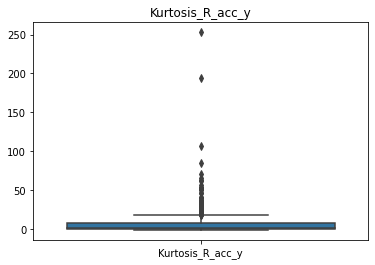

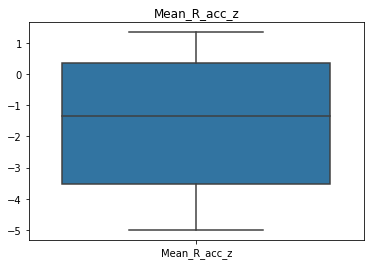

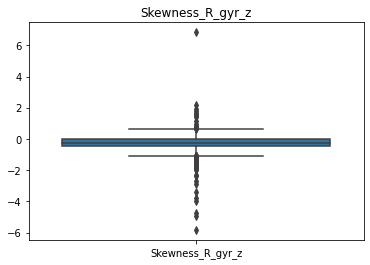

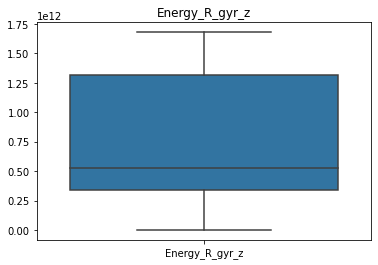

In [2122]:
plot_X(new_df.iloc[:,:-1])

## Cleaning features picked

In [2123]:
new_df_rm = new_df[new_df.iloc[:,0]<8*1e11]
new_df_rm = new_df_rm[new_df_rm.iloc[:,3]<17]
new_df_rm = new_df_rm[new_df_rm.iloc[:,5]<0.75]
new_df_rm = new_df_rm[new_df_rm.iloc[:,5]>-1.1]


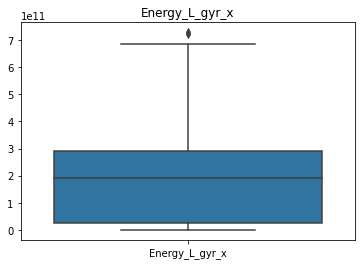

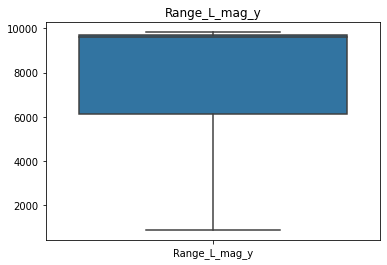

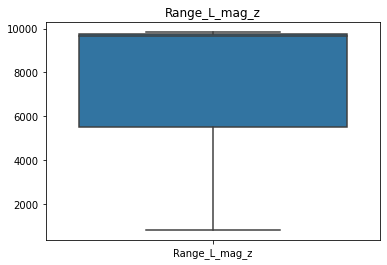

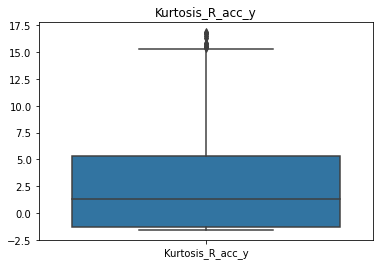

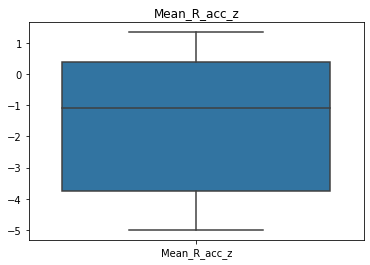

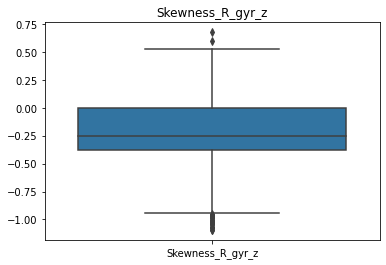

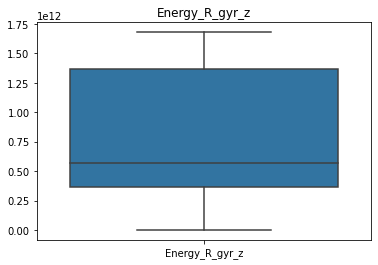

In [2124]:
plot_X(new_df_rm.iloc[:,:-1])

In [2125]:
new_df_rm.iloc[:,-1].value_counts()

spinning_bike    300
walking          299
upstairs         252
downstairs       225
Name: Label, dtype: int64

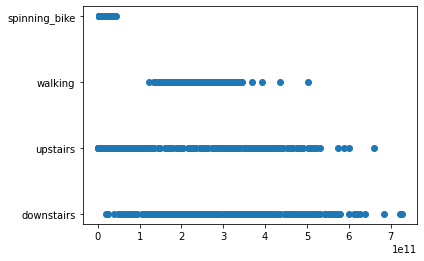

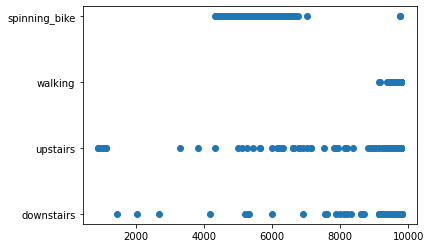

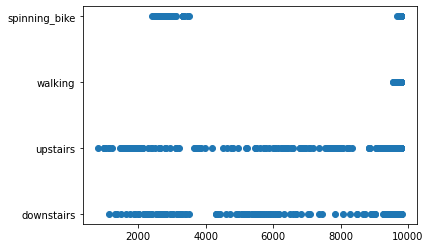

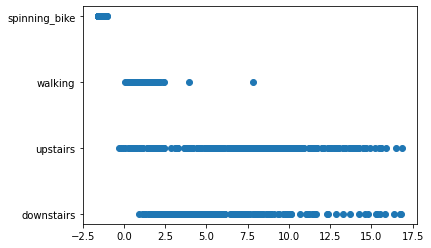

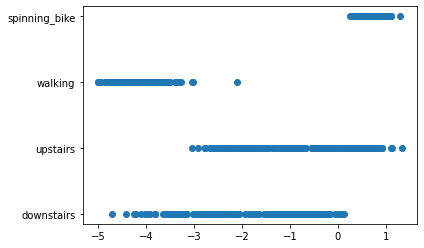

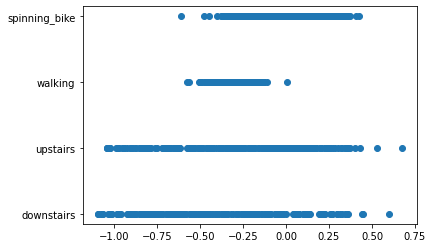

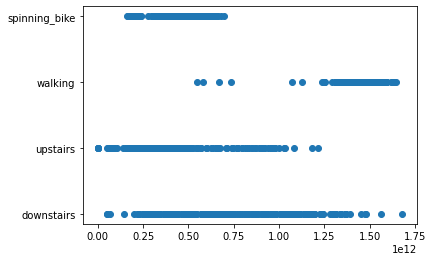

In [2126]:
for i in range(len(new_df_rm.columns)-1):
    plt.scatter(new_df_rm.iloc[:,i],new_df_rm.iloc[:,-1])
    plt.show()

In [2127]:
train_x, test_x, train_y, test_y = train_test_split(new_df_rm.iloc[:,:-1], 
                                                    new_df_rm.iloc[:,-1], 
                                                    stratify = new_df_rm.iloc[:,-1])
train_x,train_y = refill_l( train_x, train_y)
normalizer = MinMaxScaler()
encoder = LabelEncoder()
train_x = normalizer.fit_transform(train_x)
train_y = encoder.fit_transform(train_y)
print(encoder.classes_)

807
900
['downstairs' 'spinning_bike' 'upstairs' 'walking']


In [2128]:
test_x.shape

(269, 7)

In [2129]:
test_y = encoder.transform(test_y)
test_x = normalizer.transform(test_x) 


# Model training, test, and performance

### AUC and Confusion matrix

### For AUC in case of 4 classes each class has transformed to one hot probability, and then presented against another class prediction. 
### error_plot is a function i made for getting the number of points that were wrongly classified and shows the right point and wrong prediction

In [2096]:
def clf_performance(classifer, train_features, train_labels, test_features, test_labels, predict):
    train_accuracy = classifer.score(train_features, train_labels)
    test_accuracy = metrics.accuracy_score(test_labels, predict)
    cm = metrics.confusion_matrix(test_labels, predict)
    print ("testing accuracy:", test_accuracy)
    print ("confusion matrix:", cm, sep="\n")
    print(metrics.classification_report(test_labels, predict))
    cm_display = metrics.ConfusionMatrixDisplay(cm).plot()

def to_one_hot(predict,t_data):
    pre = np.zeros((predict.shape[0],4))
    for i,j in enumerate(predict):
        pre[i,j] = 1
    
    test = np.zeros((t_data.shape[0],4))
    for i,j in enumerate(test_y):
        test[i,j] = 1
    return pre,test

#https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html I used the one to many function here in sklearn website
def one_to_all_AUC(predict, test, encoder):
    predict_one, test_one = to_one_hot(predict,test)
     
    for i in range(predict_one.shape[1]):
        RocCurveDisplay.from_predictions(
        predict_one[:, i],
        test_one[:, i],
        name=f"{encoder.inverse_transform([i])} vs the rest",
        color="darkorange",
        )
        plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
        plt.axis("square")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"One-vs-Rest ROC curves:{encoder.inverse_transform([i])}")
        plt.legend()
        plt.show()
def error_plot(pred, test):
    l = []
    x = []
    for i in range(len(pred)):
        if pred[i] != test[i]:
            l.append(predict[i])
            x.append(test_y[i])
    plt.plot(l,'bx')
    plt.plot(x,'rx')
    plt.xlabel("instance")
    plt.ylabel("class")
    plt.legend(["Prediction", "True"])

### XGC model

In [2130]:
xgc = XGC()
print(cross_val_score(xgc,train_x[:,:], train_y, cv=10).mean())
# print(cross_val_score(xgc,train_x[:,ls], train_y, cv=5).mean())

0.9733333333333333


In [2131]:
x_train = train_x[:,:]
x_test = test_x[:,:]

In [2132]:
folds = KFold(10)
score = []
for i_index_train, i_index_valid in folds.split(x_train):    
    xgc.fit(x_train[i_index_train],train_y[i_index_train])
    score.append(xgc.score(x_train[i_index_valid],train_y[i_index_valid]))
score

[0.9777777777777777,
 0.9777777777777777,
 0.9777777777777777,
 0.9333333333333333,
 0.9888888888888889,
 0.9666666666666667,
 0.9888888888888889,
 0.9777777777777777,
 0.9666666666666667,
 0.9666666666666667]

In [2133]:
predict = xgc.predict(x_test)

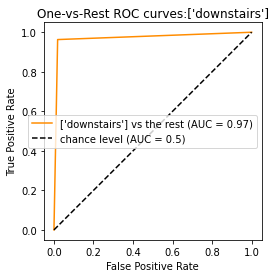

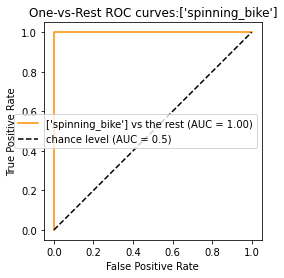

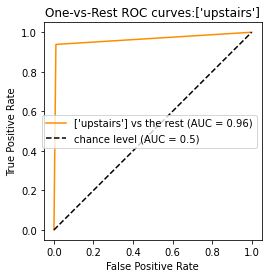

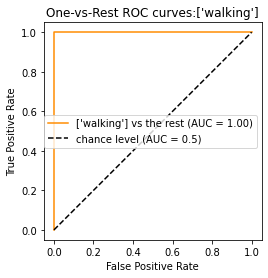

In [2134]:
one_to_all_AUC(predict, test_y, encoder)


testing accuracy: 0.9776951672862454
confusion matrix:
[[52  0  4  0]
 [ 0 75  0  0]
 [ 2  0 61  0]
 [ 0  0  0 75]]
              precision    recall  f1-score   support

           0       0.96      0.93      0.95        56
           1       1.00      1.00      1.00        75
           2       0.94      0.97      0.95        63
           3       1.00      1.00      1.00        75

    accuracy                           0.98       269
   macro avg       0.98      0.97      0.97       269
weighted avg       0.98      0.98      0.98       269



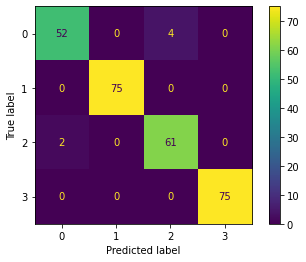

In [2135]:
x_test = test_x[:,:]
predict = xgc.predict(x_test)
clf_performance(xgc, x_train,train_y, x_test, test_y, predict)


In [2136]:
predict.reshape(-1,1).shape
# predict.shape

(269, 1)

In [2137]:
x_test[:,0].reshape(-1,1).shape

(269, 1)

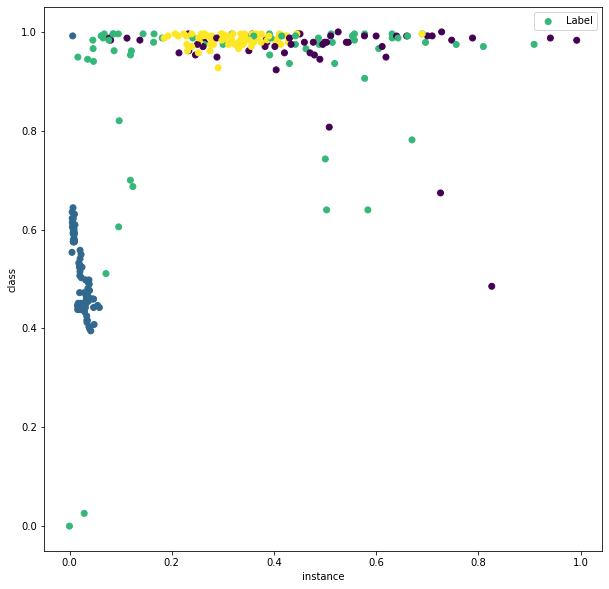

In [2138]:
plt.figure(figsize = (10,10))
plt.scatter(x_test[:,0].reshape(-1,1) , x_test[:,1].reshape(-1,1),c = predict)
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

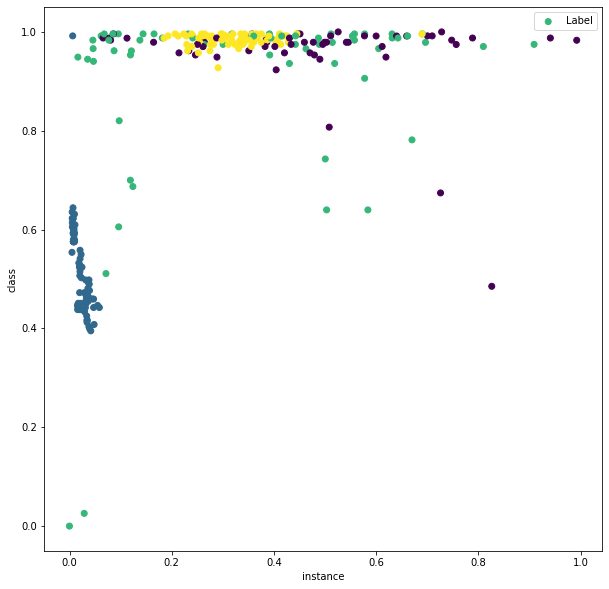

In [2139]:
plt.figure(figsize = (10,10))
plt.scatter(x_test[:,0].reshape(-1,1) , x_test[:,1].reshape(-1,1),c = test_y)
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

#### In the following figures the mistakes that the model classified.

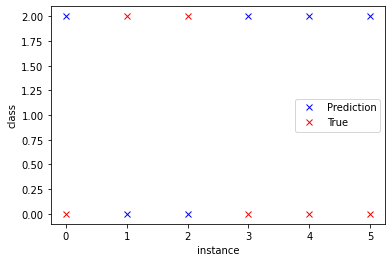

In [2140]:
error_plot(predict, test_y)

## KNN Model

In [2141]:
knn = KNN()
print(cross_val_score(knn,train_x[:,:], train_y, cv=10).mean())


0.9666666666666668


In [2142]:
folds = KFold(10)
score = []
for i_index_train, i_index_valid in folds.split(x_train):
    
    knn.fit(x_train[i_index_train],train_y[i_index_train])
    score.append(knn.score(x_train[i_index_valid],train_y[i_index_valid]))


sum(score)/len(score)

0.9655555555555557

testing accuracy: 0.9702602230483272
confusion matrix:
[[53  0  3  0]
 [ 0 75  0  0]
 [ 5  0 58  0]
 [ 0  0  0 75]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        56
           1       1.00      1.00      1.00        75
           2       0.95      0.92      0.94        63
           3       1.00      1.00      1.00        75

    accuracy                           0.97       269
   macro avg       0.97      0.97      0.97       269
weighted avg       0.97      0.97      0.97       269



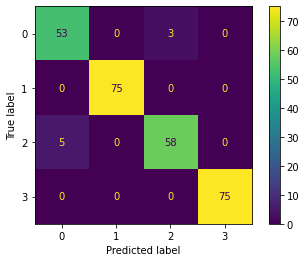

In [2143]:
predict = knn.predict(x_test)
clf_performance(knn, x_train,train_y, x_test, test_y, predict)

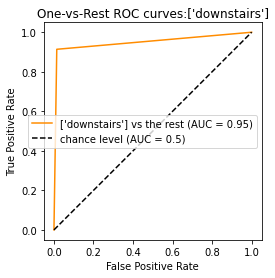

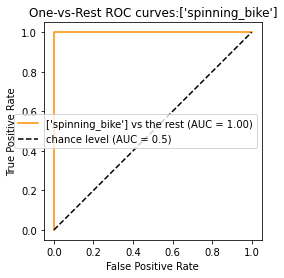

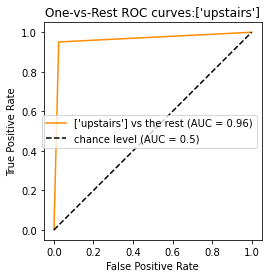

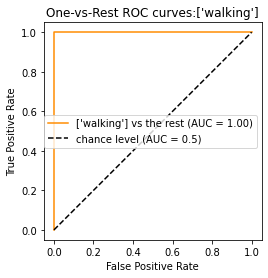

In [2144]:
one_to_all_AUC(predict, test_y, encoder)


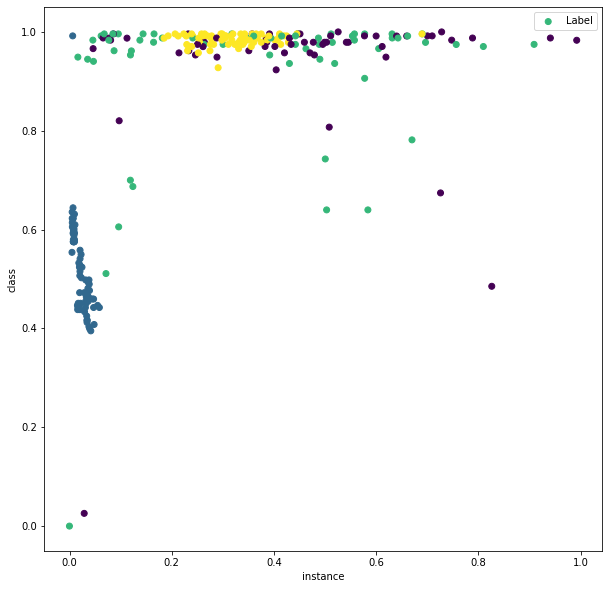

In [2145]:
plt.figure(figsize = (10,10))
plt.scatter(x_test[:,0].reshape(-1,1) , x_test[:,1].reshape(-1,1),c = predict)
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

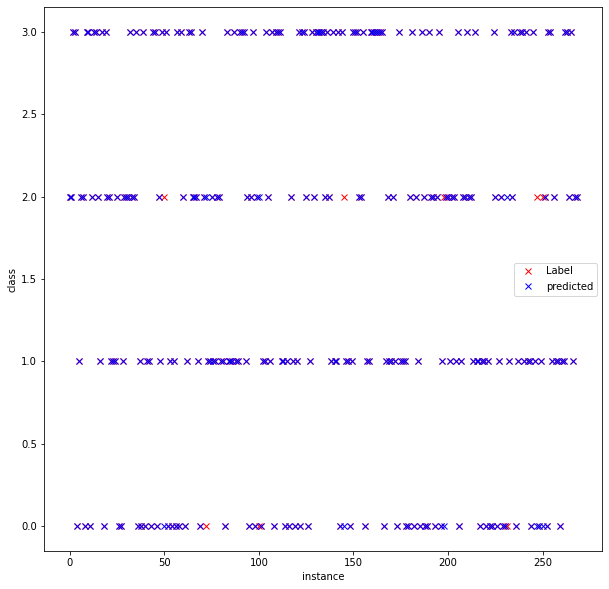

In [2146]:
plt.figure(figsize = (10,10))
plt.plot(test_y,'rx')
plt.plot(predict,'bx')
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

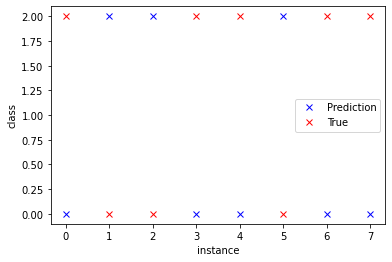

In [2147]:
error_plot(predict, test_y)

## SVC 


In [2148]:
svc = SVC()
print(cross_val_score(svc,train_x[:,:], train_y, cv=10).mean())
# print(cross_val_score(svc,train_x[:,ls], train_y, cv=5).mean())

0.9588888888888889


In [2149]:
folds = KFold(10)
score = []
for i_index_train, i_index_valid in folds.split(x_train):
#     print('train',train_x[i_index_train])
    
    svc.fit(x_train[i_index_train],train_y[i_index_train])
    score.append(svc.score(x_train[i_index_valid],train_y[i_index_valid]))

#     print(i_index_train)
#     print('valid',train_x[i_index_valid])
#     print(i_index_valid)
#     print("MEEH")
score

[0.9444444444444444,
 0.9777777777777777,
 0.9666666666666667,
 0.9222222222222223,
 0.9888888888888889,
 0.9555555555555556,
 0.9666666666666667,
 0.9666666666666667,
 0.9444444444444444,
 0.9444444444444444]

testing accuracy: 0.9739776951672863
confusion matrix:
[[52  0  4  0]
 [ 0 75  0  0]
 [ 3  0 60  0]
 [ 0  0  0 75]]
              precision    recall  f1-score   support

           0       0.95      0.93      0.94        56
           1       1.00      1.00      1.00        75
           2       0.94      0.95      0.94        63
           3       1.00      1.00      1.00        75

    accuracy                           0.97       269
   macro avg       0.97      0.97      0.97       269
weighted avg       0.97      0.97      0.97       269



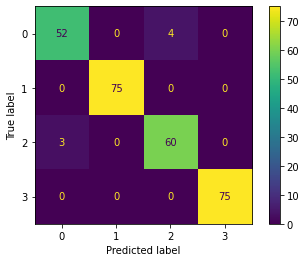

In [2150]:
predict = svc.predict(x_test)
clf_performance(svc, x_train,train_y, x_test, test_y, predict)

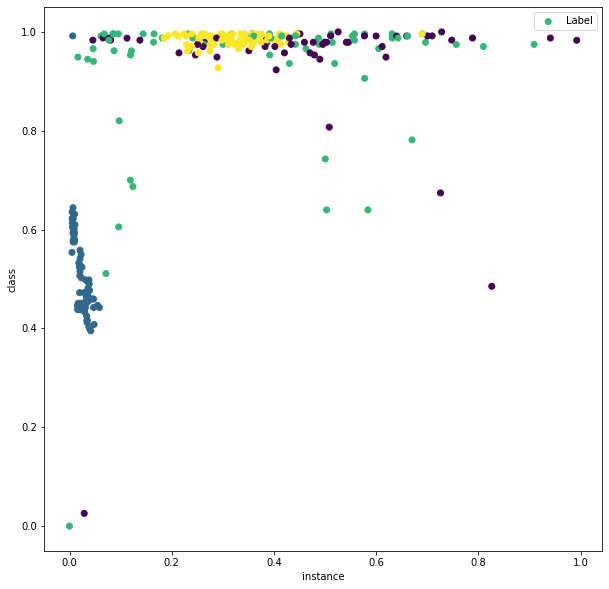

In [2151]:
plt.figure(figsize = (10,10))
plt.scatter(x_test[:,0].reshape(-1,1) , x_test[:,1].reshape(-1,1),c = predict)
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

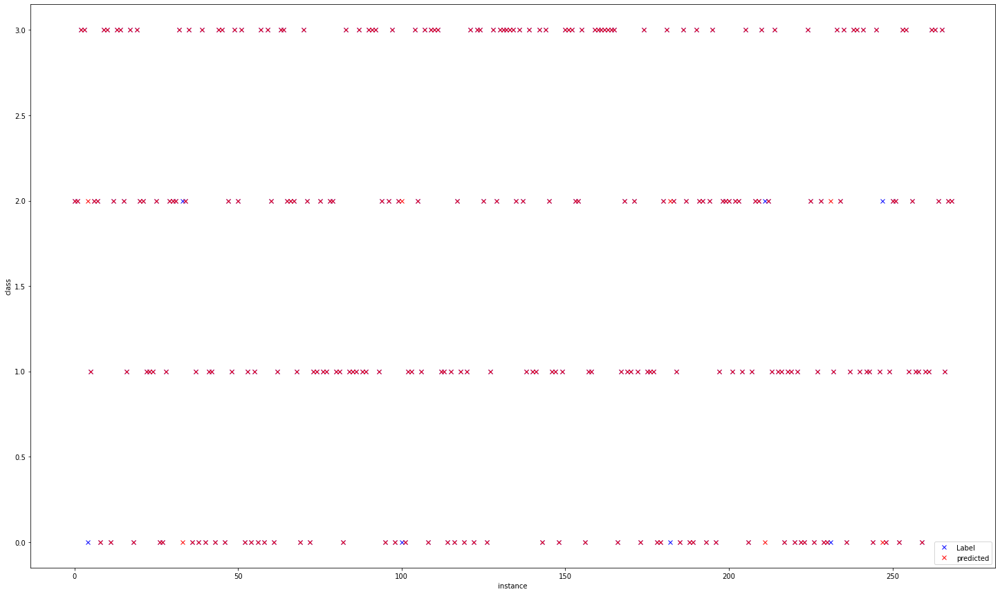

In [2152]:
plt.figure(figsize = (25,15))
plt.plot(test_y,'bx')
plt.plot(predict,'rx')
plt.xlabel("instance")
plt.ylabel("class")
plt.legend(["Label","predicted"])

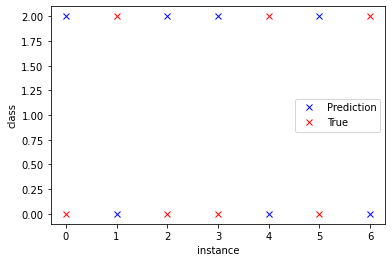

In [2153]:
error_plot(predict, test_y)

### Q(4) KNN has done best among the 3 algorithm because it scored  F1 score 95% for class1, 100 % for class 2,  96% for class 3 and 99% for class 4. 

### In summary. There were a lot of outliers that affects Class  downstairs class and upstairs. When removing so much outliers it cleaves the dataset and results to 0 rows. Reducing the outliers could improve the models performance.
